In [37]:
#Import dependent modules
import matplotlib.pyplot as plt
import numpy as np
import os, sys, cv2
import random
import json
%matplotlib inline

In [38]:
#Load necessary data

#There are four kinds of label in CalTech Pedestrian data set
label_set = {'person', 'people', 'person-fa', 'person?'}  

#Load the ground truth annotation. You shold specify the file path of json ground truth
old_anno_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/annotations.json"
new_anno_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/new_anno.json"
old_annotation = json.load(open(old_anno_path))
new_annotation = json.load(open(new_anno_path))

In [46]:
def get_frames(gt_annotation):

    target_frames = []
    for set_num, set_annotation in gt_annotation.items():
        for v_num, v_annotation in set_annotation.items():
            for frame_num, boxes in v_annotation["frames"].items():
                filtered_box = [box for box in boxes ]
                
                #Only the the frames contain valid boxes are returned
                if len(filtered_box) > 0:
                    frame_name = "{}_{}_{}.jpg".format(set_num, v_num, frame_num)
                    target_frames.append((frame_name, filtered_box))
                      
    return target_frames
def get_boxes(gt_annotation, frame_name):
    set_num, v_num, frame_num = frame_name[:-4].split("_")
    if frame_num not in gt_annotation[set_num][v_num]["frames"].keys():
        return []
    return gt_annotation[set_num][v_num]["frames"][frame_num]

In [78]:
#A function that renders the image with bounding boxes
def render_frame(frame_name, boxes, compare_boxes):
    #You probably need to change the file path.
    images_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/images"
    
    frame_path = os.path.join(images_path, frame_name)
    im = cv2.imread(frame_path)[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    
    label_to_color = {"people": "red", "person": "green", "person-fa": "blue", "person?": "yellow","ignore" : "orange"}
    
  
    if compare_boxes == 0:
        for box in boxes:
            x1 = box['pos'][0]
            y1 = box['pos'][1]
            width = box['pos'][2]
            length = box['pos'][3]
            label = box['lbl']
            color = label_to_color[label]
            #color = "red"
            rectangle = plt.Rectangle((x1,y1), width,length, fill=False, edgecolor=color, linewidth=1.5)
            ax.add_patch(rectangle)
            ax.text(x1, y1 - 2, label,
                    bbox=dict(facecolor=color, alpha=0.5),
                    fontsize=14, color='white')
        frame_name = frame_name + "_new"
        
        
    elif compare_boxes == 1:
        for box in boxes:
            #print "box",box
            x1 = box['pos'][0]
            y1 = box['pos'][1]
            width = box['pos'][2]
            length = box['pos'][3]
            label = box['lbl']
            color = label_to_color[label]
            #color = "green"
            rectangle = plt.Rectangle((x1,y1), width,length, fill=False, edgecolor=color, linewidth=1.5, \
                                      linestyle='dashed')
            ax.add_patch(rectangle)
            ax.text(x1, y1 - 2, label,
                    bbox=dict(facecolor=color, alpha=0.5),
                    fontsize=14, color='white')
        frame_name = frame_name + "_old"
            
    
    ax.set_title(frame_name)  
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [76]:
#Apply the specified box_filter and verify it by rendering N images with the filtered bounding boxes
#A comparing filter can also be applied. The boxes from the comparing filter are dotted lines.
def verify_annotations(N,old_anno,new_anno):
    old_frames = get_frames(old_anno)
    new_frames = get_frames(new_anno)
    old_bbox_count = 0
    new_bbox_count = 0
    for _, bboxes in old_frames:
        old_bbox_count += len(bboxes)
    for _, bboxes in new_frames:
        new_bbox_count += len(bboxes)
        
    
    
    print("Old:{} frames and {} bbox".format(len(old_frames), old_bbox_count))
    print("New:{} frames and {} bbox".format(len(new_frames), new_bbox_count))
    sampled_indices =  random.sample(range(len(new_frames)) ,N)

    #Render the selected images
    for sampled_index in sampled_indices :
        print "sampled index",sampled_index
        frame_name, boxes = new_frames[sampled_index]
        
        compare_boxes = get_boxes(old_anno,frame_name)
        #print compare_boxes
        #print boxes
        render_frame(frame_name, boxes, 0)
        render_frame(frame_name, compare_boxes,1)

Old:132082 frames and 346621 bbox
New:5039 frames and 18152 bbox
sampled index 3476
sampled index 3898
sampled index 2684
sampled index 1096
sampled index 4751
sampled index 3828
sampled index 3643
sampled index 1878
sampled index 4072
sampled index 4275


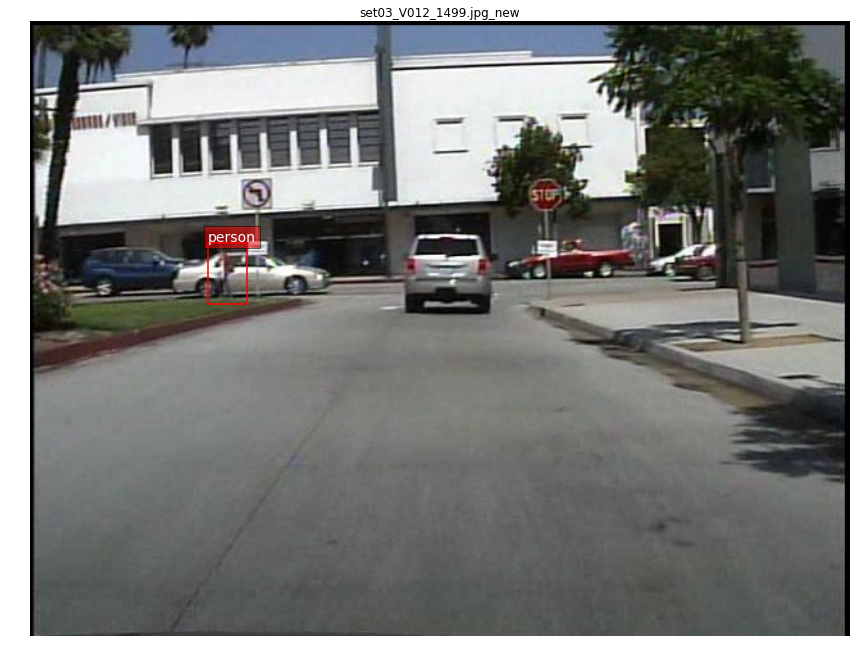

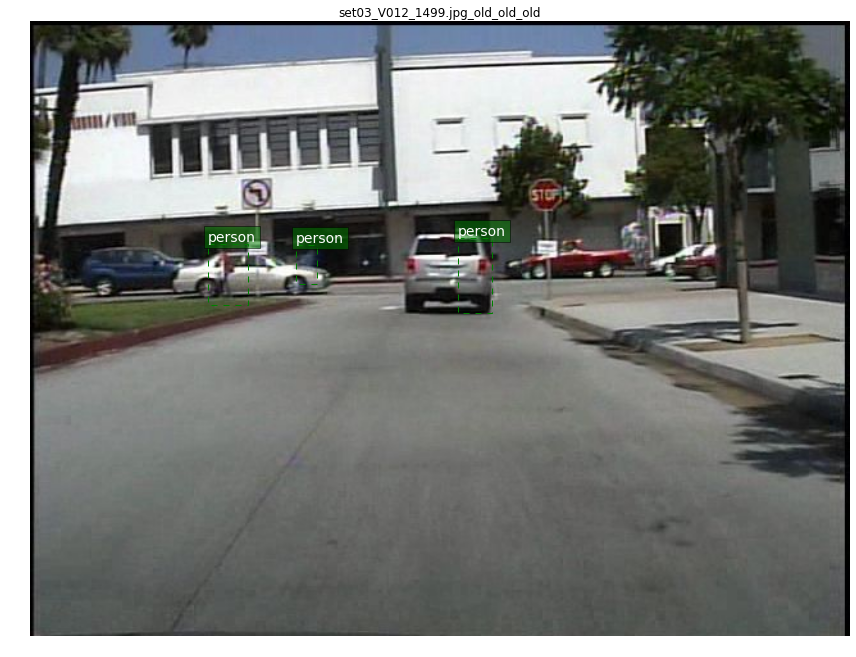

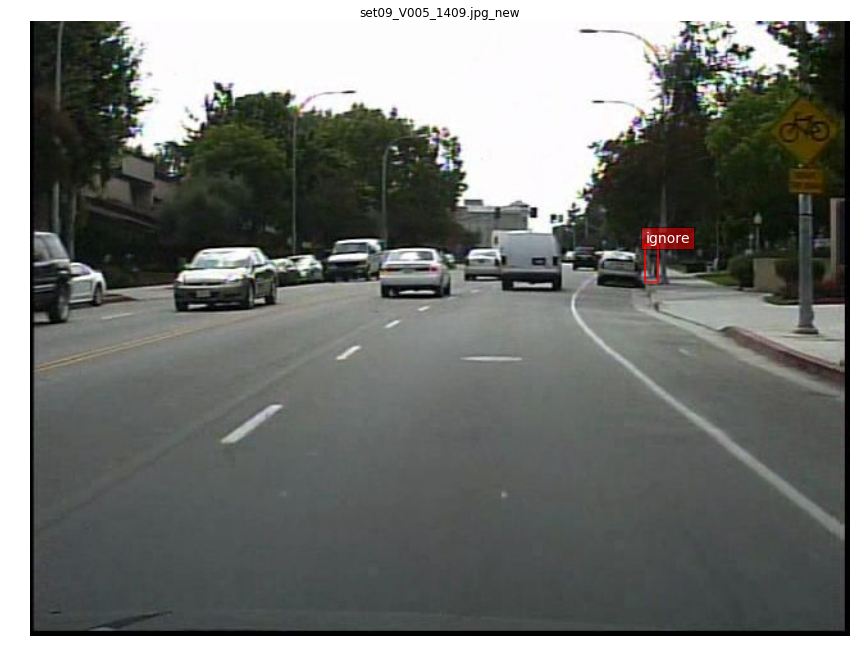

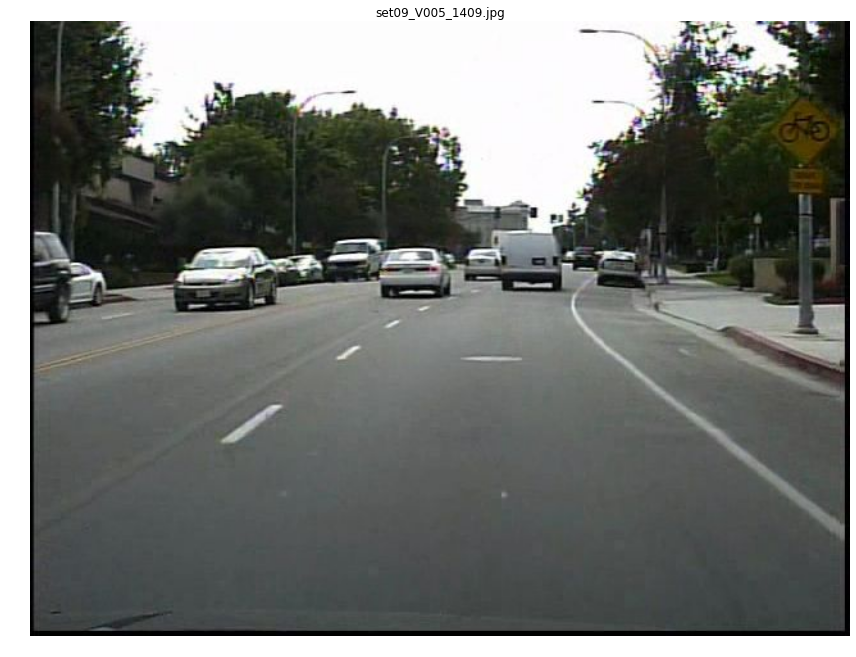

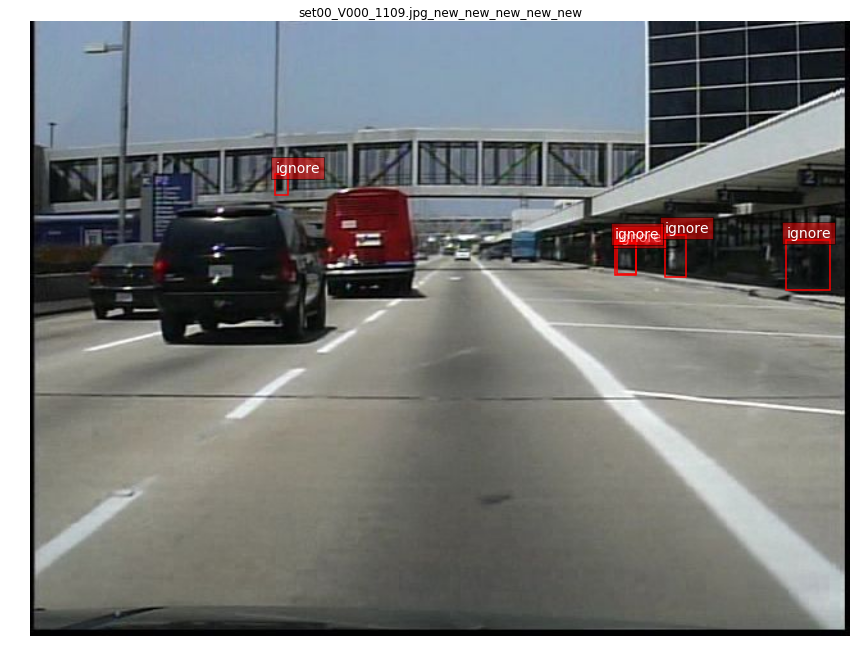

...

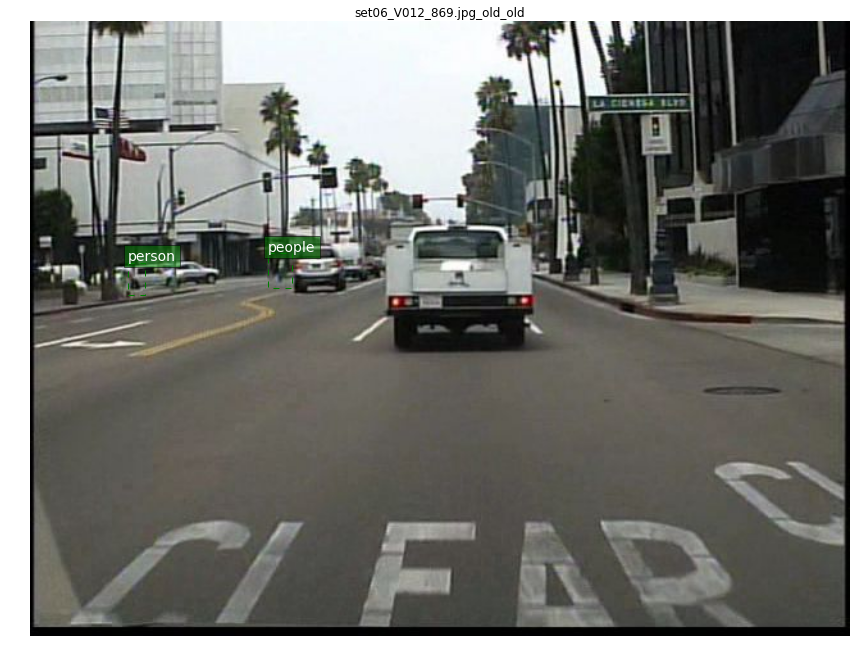

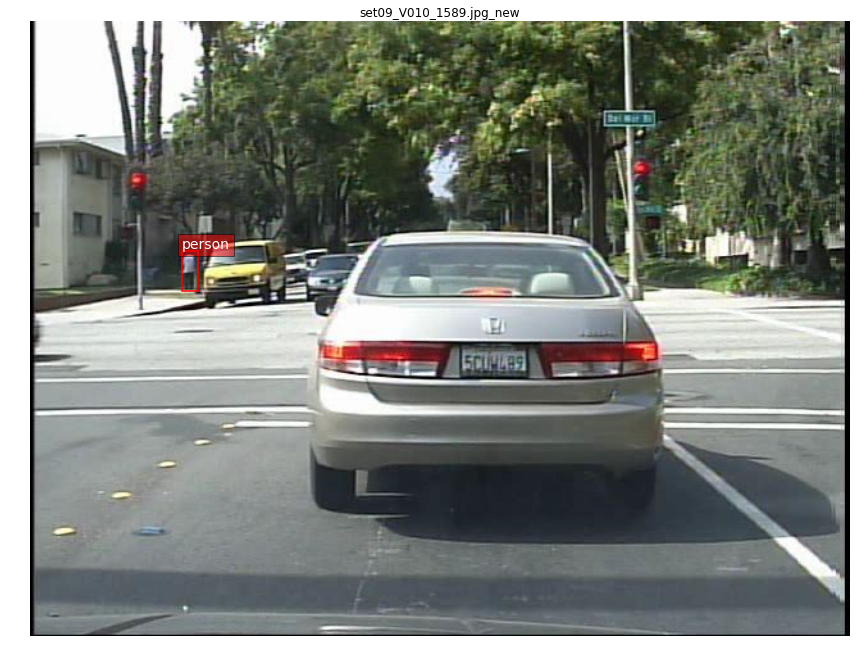

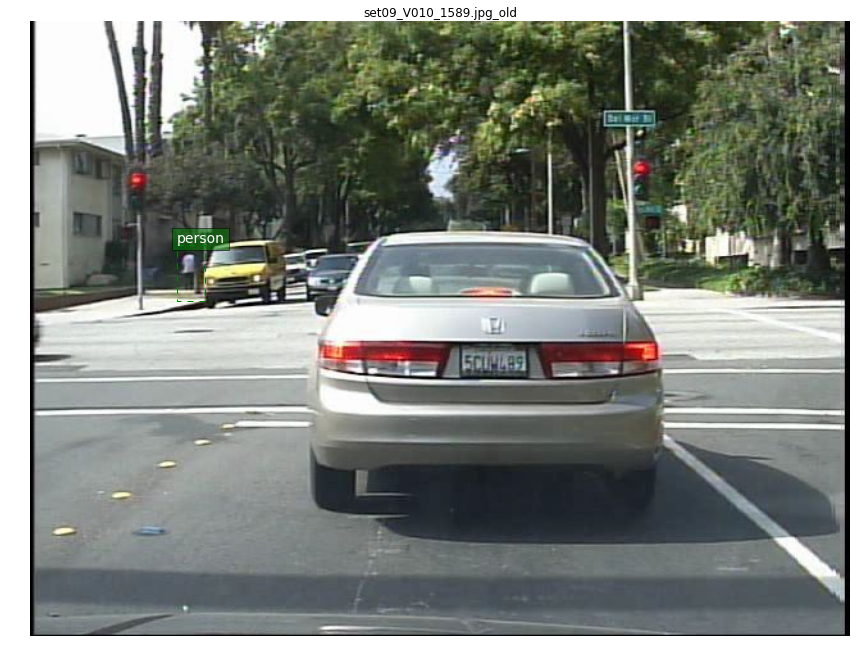

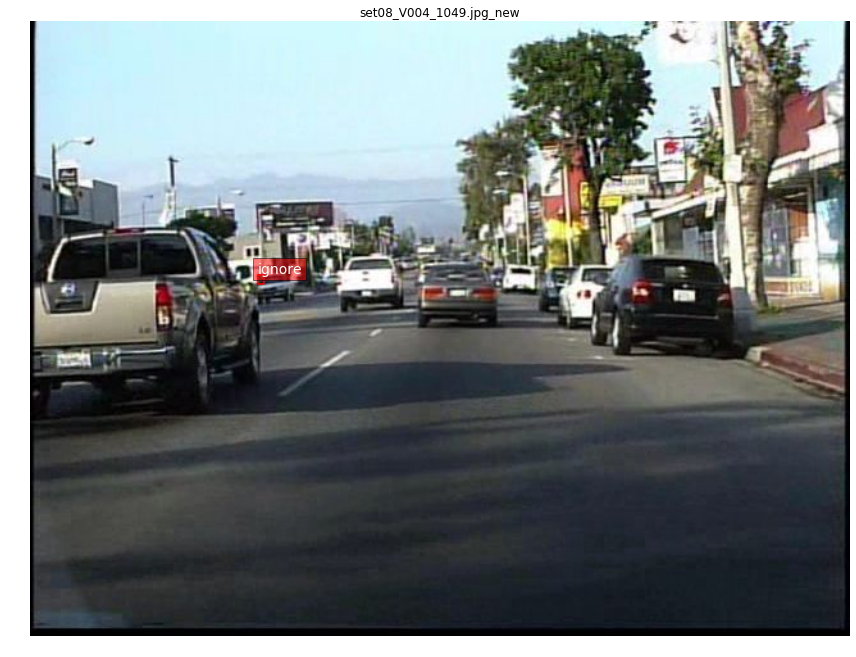

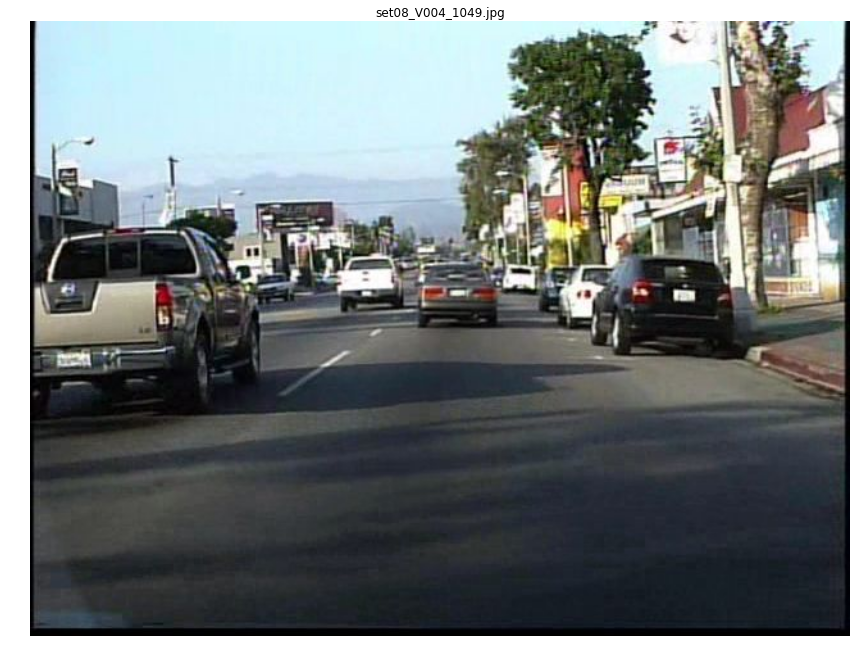

In [77]:
verify_annotations(10,old_annotation,new_annotation)